In [1]:
import os 
import numpy as np
import matplotlib.pyplot as plt
import emcee
import corner

In [2]:
# reader = emcee.backends.HDFBackend("output/backend_20231103t1828.hdf")
reader = emcee.backends.HDFBackend("output/backend_20231105t1259.hdf")
print(reader.shape)

(400, 25)


In [3]:
tau = reader.get_autocorr_time(tol=1)

In [4]:
chain = reader.get_chain()

In [5]:
acc_rate = reader.accepted/chain.shape[0]

In [6]:
print(acc_rate.mean())

0.10154850746268657


In [7]:
print(tau.mean())

27.746427670753807


In [8]:
print(chain.shape)

(268, 400, 25)


In [9]:
print(tau)

[28.97540467 27.92347459 26.94644904 27.60359388 27.39759361 27.4809861
 27.26778389 26.46759434 26.691958   27.50316326 27.48665358 27.18776484
 27.58296102 28.15019422 27.81012945 28.03255438 28.37229665 28.16179301
 27.85417603 28.16651662 28.34021721 27.82195377 28.38313101 27.9035056
 28.14884303]


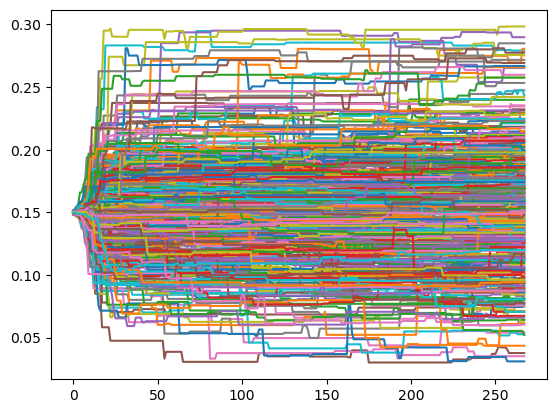

In [15]:
plt.plot(chain[:, :, 22])

In [11]:
flat_chain = reader.get_chain(discard=90, flat=True)
print(flat_chain.shape)

(71200, 25)


In [12]:
labels = ["idrk", "W11", "W12", "W21", "W22", "W31", "W32", "W41", "W42", "W51", "W52", "W61", "W62"
          , "C1", "C2", "C3", "C4", "C5", "C6", "T1", "T2", "T3", "T4", "T5", "T6"]

/home/pinchen/anaconda3/envs/exosims/lib/python3.11/site-packages/corner/core.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


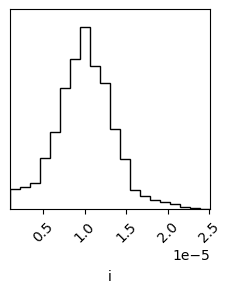

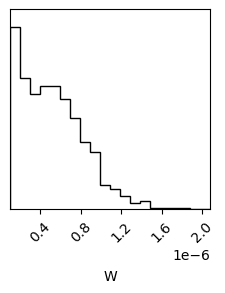

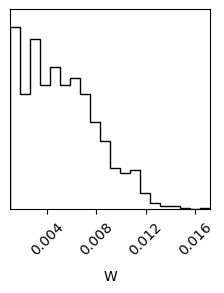

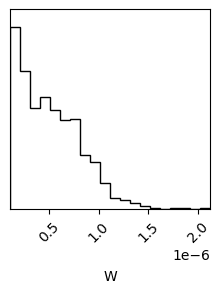

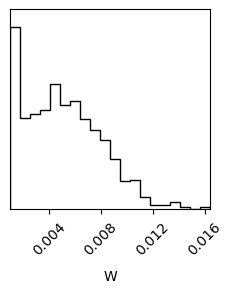

...

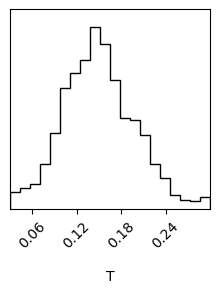

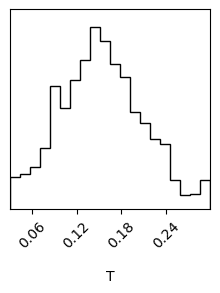

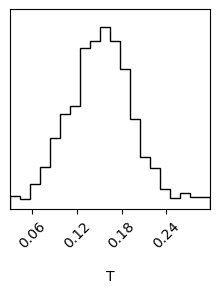

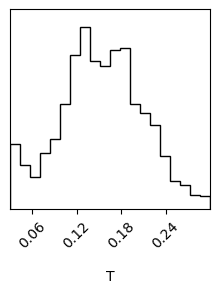

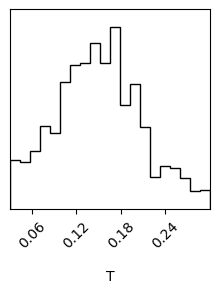

In [13]:
for i in range(flat_chain.shape[1]):
    fig = corner.corner(flat_chain[:, i:i+1], labels=labels[i])

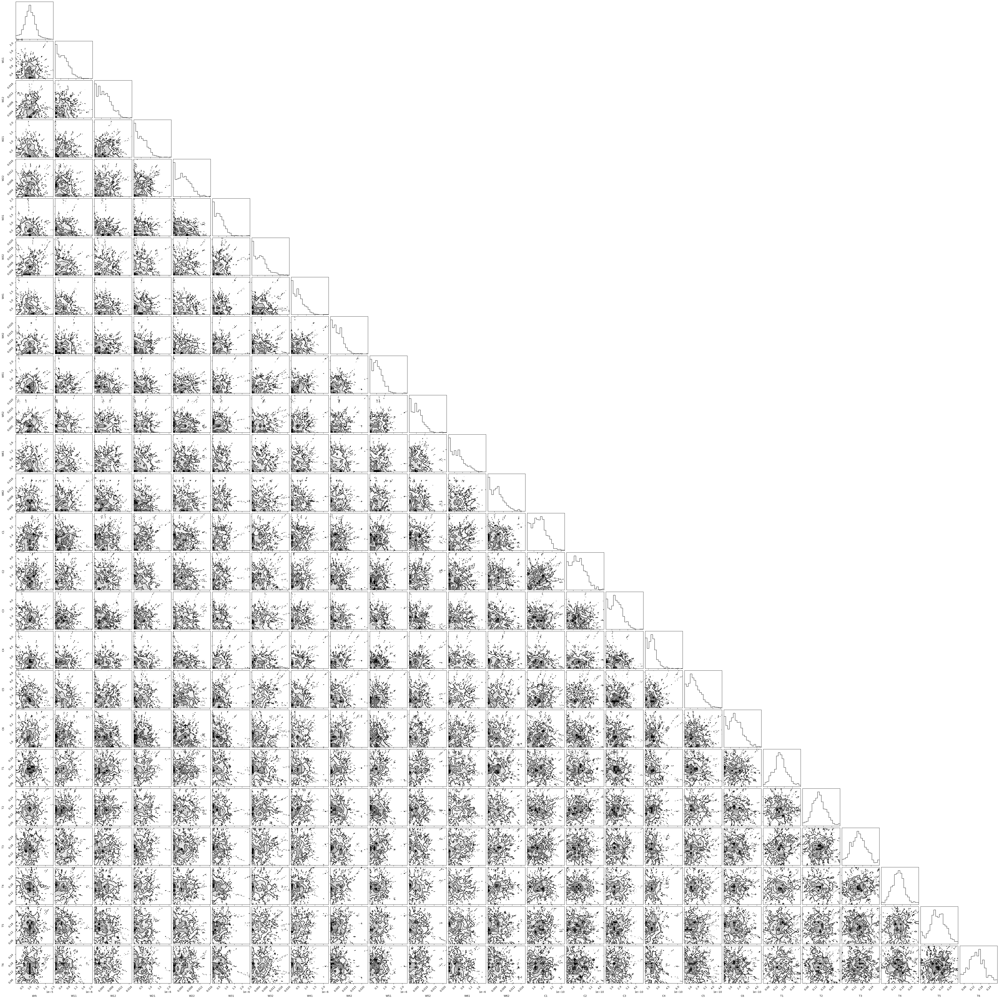

In [14]:
fig = corner.corner(flat_chain, labels=labels)